In [2]:
import pandas as pd
from cleaning_function import *
import numpy as np
import random
np.random.seed(222)
random.seed(222)
import matplotlib.pyplot as plt
pd.set_option('display.max_colwidth', None)


data = pd.read_csv('cvrm_master.csv')
data.replace([np.inf, -np.inf], np.nan, inplace=True)

/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/1803183051.py:11: DtypeWarning: Columns (1697,1698) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('cvrm_master.csv')


# Clean up and general motivations, and also maps


In [3]:
fips = data['fips']
longitude = data['Longitude']
latitude = data['Latitude']

drop_cols = ['fips', 'Sort [1]', 'FIPS', 'Unnamed: 0', 'Longitude', 'Latitude',
             'Land Area km²', 'Land Area mi²', 'Water Area km²', 'Water Area mi²', 
             'Total Area km²', 'Total Area mi²']
data = data.drop(columns=[col for col in drop_cols if col in data.columns])


# replacements = {
#         "Risk Behavior percent pop": "Risk Behavior (%)",
#         "percent pop": "Population (%)",
#         "medicacine for hypertension control": "Hypertension Medication Use",
#         "sleep less 7hr": "Short Sleep Duration",
#         "Index For Environment With Access To Healthy Food": "Healthy Food Access Index",
#         "Per Capita Income In the Past Year": "Per Capita Income",
#         "API Civilian Noninstitutionalized Population For Insurance Coverage": "Uninsured API Population",
#         "Winter Weather Expected Annual Loss Score": "Winter Weather Risk Score",
#         "Heat Wave Historic Loss Ratio Buildings": "Heat Wave Damage Ratio (Buildings)",
#         "HealthStatus percent pop general health not good": "Poor Health Status (%)",
#         "Tornado Expected Annual Loss Score": "Tornado Risk Score"
#     }



In [4]:
data

,statecounty_x,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2016,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2017,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2018,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2019,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2020,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2021,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2016,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2017,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2018,...,"Expected Population 2020, total, ages 55-59","Expected Population 2020, total, ages 60-64","Expected Population 2020, total, ages 65-69","Expected Population 2020, total, ages 70-74","Expected Population 2020, total, ages 75-79",Code,State,County [2],County Seat(s) [3],Population (2010)
0,01autauga,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4085.46,3483.00,2628.37,2183.59,1620.94,01autauga,AL,Autauga,Prattville,54571
1,01baldwin,7.2,7.4,7.1,7.5,7.9,7.3,0.0,0.000,0.000,...,12612.46,12158.07,10783.76,9674.46,7689.06,01baldwin,AL,Baldwin,Bay Minette,182265
2,01barbour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2003.35,1719.75,1536.10,1445.48,943.48,01barbour,AL,Barbour,Clayton,27457
3,01bibb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1675.91,1412.47,1136.45,1023.28,643.26,01bibb,AL,Bibb,Centreville,22915
4,01blount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3884.37,3472.96,3117.66,2815.41,2099.01,01blount,AL,Blount,Oneonta,57322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,56sweetwater,5.0,5.6,5.4,4.4,3.6,NaN,0.0,0.000,0.000,...,2870.24,3202.31,2723.26,1797.71,997.16,56sweetwater,WY,Sweetwater,Green River,43806
3139,56teton,4.4,4.8,5.1,3.6,4.8,5.1,0.0,0.003,0.003,...,1490.07,1535.49,1449.62,1148.10,760.06,56teton,WY,Teton,Jackson,21294
3140,56uinta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1367.07,1615.53,1353.29,854.44,533.69,56uinta,WY,Uinta,Evanston,21118
3141,56washakie,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,563.92,600.18,568.73,461.20,380.78,56washakie,WY,Washakie,Worland,8533


In [5]:
data['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021'].isnull().sum()

67

In [6]:
# data = data.replace(np.inf, np.nan, inplace=True)
data_less_nan = drop_null_columns(data, 0.3)
data_less_corr = data_less_nan

In [7]:
all_race = exclude_columns(data_less_corr,['single_race', 'nhpi', 'asian', 'aian', 'black'])
# for col in all_race.columns:
#     print(col)

all_race.shape

(3143, 503)

In [8]:
all_race_clean = KNN_single_columns_imputation_numeric(all_race, None, 10)

/Users/diyakannan/Documents/CVD-ML-project/CVRM codings/cleaning_function.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[numeric_columns] = imputer.fit_transform(df[numeric_columns])


In [9]:
response_set = include_columns(all_race_clean, ['outcome'])
response_set.isnull().sum()

HealthOutcome_percent_pop_with_highcholesterol_PLACES_BRFSS_2021            0
HealthOutcome_percent_pop_with_stroke_PLACES_BRFSS_2021                     0
HealthOutcome_health_percent_pop_with_depression_PLACES_BRFSS_2021          0
HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021    0
HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021                    0
HealthOutcome_percent_pop_with_asthma_Places_BRFSS_2021                     0
HealthOutcome_percent_pop_with_diagnosed_Diabetes_PLACES_BRFSS_2021         0
HealthOutcome_percent_pop_with_hypertension_PLACES_BRFSS_2021               0
HealthOutcome_percent_pop_with_coronary_heart_diseases_PLACES_BRFSS_2021    0
dtype: int64

In [10]:
include_columns(all_race_clean, ['state'])

,statecounty_x,State
0,01autauga,AL
1,01baldwin,AL
2,01barbour,AL
3,01bibb,AL
4,01blount,AL
...,...,...
3138,56sweetwater,WY
3139,56teton,WY
3140,56uinta,WY
3141,56washakie,WY


In [11]:
years_ahead = include_columns(data_less_corr,['2022'])
state_info = fips
state_info

0        1001
1        1003
2        1005
3        1007
4        1009
        ...  
3138    56037
3139    56039
3140    56041
3141    56043
3142    56045
Name: fips, Length: 3143, dtype: int64

In [12]:
from vega_datasets import data
import altair as alt

us_counties = alt.topo_feature(data.us_10m.url, "counties")


In [13]:

map_data = all_race_clean[['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021']]
map_data['FIPS'] = fips
map_data['Longitude'] = longitude
map_data['Latitude'] = latitude
map_data

/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/1283632785.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data['FIPS'] = fips
/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/1283632785.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data['Longitude'] = longitude
/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/1283632785.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

,HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021,FIPS,Longitude,Latitude
0,38.9,1001,-86.644490,32.536382
1,37.2,1003,-87.746067,30.659218
2,43.4,1005,-85.405456,31.870670
3,39.6,1007,-87.127148,33.015893
4,37.7,1009,-86.567246,33.977448
...,...,...,...,...
3138,34.3,56037,-108.875676,41.660339
3139,21.7,56039,-110.588102,44.049321
3140,33.3,56041,-110.558947,41.284726
3141,33.6,56043,-107.669052,43.878831


In [14]:

map_data.rename(columns={
    "HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021": "HealthOutcome"
}, inplace=True)
map_data

/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/3253173790.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data.rename(columns={


,HealthOutcome,FIPS,Longitude,Latitude
0,38.9,1001,-86.644490,32.536382
1,37.2,1003,-87.746067,30.659218
2,43.4,1005,-85.405456,31.870670
3,39.6,1007,-87.127148,33.015893
4,37.7,1009,-86.567246,33.977448
...,...,...,...,...
3138,34.3,56037,-108.875676,41.660339
3139,21.7,56039,-110.588102,44.049321
3140,33.3,56041,-110.558947,41.284726
3141,33.6,56043,-107.669052,43.878831


In [15]:
import altair as alt
from vega_datasets import data

us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "HealthOutcome:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Percent population Obesity(%)")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data, "FIPS", ["HealthOutcome"])  
).properties(
    width=500,
    height=300,title = 'Graph1: Obesity distribution across US'
).project("albersUsa")
filled_map


alt.Chart(...)

In [16]:

map_data2 = all_race_clean[['Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020']]
map_data2['FIPS'] = fips
map_data2['Longitude'] = longitude
map_data2['Latitude'] = latitude



map_data2.rename(columns={
    'Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020': "HeatWave"
}, inplace=True)
map_data2

/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/1951368195.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data2['FIPS'] = fips
/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/1951368195.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data2['Longitude'] = longitude
/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_51057/1951368195.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

,HeatWave,FIPS,Longitude,Latitude
0,2.697100e-10,1001,-86.644490,32.536382
1,6.087870e-10,1003,-87.746067,30.659218
2,2.697100e-10,1005,-85.405456,31.870670
3,2.697100e-10,1007,-87.127148,33.015893
4,2.697100e-10,1009,-86.567246,33.977448
...,...,...,...,...
3138,3.537483e-05,56037,-108.875676,41.660339
3139,3.537483e-05,56039,-110.588102,44.049321
3140,3.537483e-05,56041,-110.558947,41.284726
3141,3.537483e-05,56043,-107.669052,43.878831


In [16]:
import altair as alt
from vega_datasets import data

us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "HeatWave:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Heat Wave Loss Ratio")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data2, "FIPS", ["HeatWave"])  
).properties(
    width=500,
    height=300,
).project("albersUsa")
filled_map

alt.Chart(...)

In [17]:
map_data3 = all_race_clean[['Percent_Population_In_Production_Transportation_And_Material_Moving_Occupations_ACS2016_20']]
map_data3['FIPS'] = fips
map_data3['Longitude'] = longitude
map_data3['Latitude'] = latitude



map_data3.rename(columns={
    'Percent_Population_In_Production_Transportation_And_Material_Moving_Occupations_ACS2016_20': "Transportation Occupation"
}, inplace=True)
map_data3


/var/folders/26/l89mqgp17zj82yvlmd3z3r200000ks/T/ipykernel_61283/4228611291.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data3['FIPS'] = fips
/var/folders/26/l89mqgp17zj82yvlmd3z3r200000ks/T/ipykernel_61283/4228611291.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data3['Longitude'] = longitude
/var/folders/26/l89mqgp17zj82yvlmd3z3r200000ks/T/ipykernel_61283/4228611291.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

,Transportation Occupation,FIPS,Longitude,Latitude
0,0.0849,1001,-86.644490,32.536382
1,0.0705,1003,-87.746067,30.659218
2,0.0970,1005,-85.405456,31.870670
3,0.1046,1007,-87.127148,33.015893
4,0.1091,1009,-86.567246,33.977448
...,...,...,...,...
3138,0.1041,56037,-108.875676,41.660339
3139,0.0606,56039,-110.588102,44.049321
3140,0.1022,56041,-110.558947,41.284726
3141,0.1087,56043,-107.669052,43.878831


In [18]:
us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "Transportation Occupation:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Transportation Occupation")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data3, "FIPS", ["Transportation Occupation"])  
).properties(
    width=500,
    height=300
).project("albersUsa")
filled_map

alt.Chart(...)

# Lasso and Ridge imputation

In [31]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

y = all_race_clean['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021']
all_race_no_obe = exclude_columns(all_race_clean, ['healthoutcome'])
# all_race_no_obe = exclude_columns(all_race_clean, ['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021'])
x = all_race_no_obe.select_dtypes(include = ['number'])



scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)



from sklearn.linear_model import LassoCV, RidgeCV
lasso_cv = LassoCV(alphas=np.logspace(-4, 1, 50), cv=5, random_state=222)
ridge_cv = RidgeCV(alphas=np.logspace(-4, 1, 50), store_cv_values=True)

lasso_cv.fit(x_scaled, y)
ridge_cv.fit(x_scaled, y)
best_alpha_lasso = lasso_cv.alpha_
best_alpha_ridge = ridge_cv.alpha_

print(f"Optimal Lasso: {best_alpha_lasso}")
print(f"Optimal Ridge: {best_alpha_ridge}")





/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.8177066406115046, tolerance: 4.149193484486872
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.634542144895022, tolerance: 4.149193484486872
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105.78717957268873, tolerance: 4.149193484486872
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:

Optimal Lasso: 0.05689866029018299
Optimal Ridge: 10.0


In [32]:
# finding feature importance and store them

lasso = Lasso(alpha = best_alpha_lasso, random_state= 222)
lasso.fit(x_scaled, y)

ridge = Ridge(alpha = best_alpha_ridge, random_state= 222)
ridge.fit(x_scaled, y)

features = x.columns

lasso_importance = pd.Series(np.abs(lasso.coef_), index=features)
ridge_importance = pd.Series(np.abs(ridge.coef_), index=features)

lasso_importance = lasso_importance.sort_values(ascending=False)
ridge_importance = ridge_importance.sort_values(ascending=False)

print("Lasso Feature Importance:")
print(lasso_importance)
print("\nRidge Feature Importance:")
print(ridge_importance)


top200_lasso = list(lasso_importance.index[:200])
top200_ridge = list(ridge_importance.index[:200])
top100_lasso = list(lasso_importance.index[:100])
top100_ridge = list(ridge_importance.index[:100])
top50_lasso = list(lasso_importance.index[:50])
top50_ridge = list(ridge_importance.index[:50])

Lasso Feature Importance:
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021    1.478291
percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021              0.954353
Per_Capita_Income_In_the_Past_Year_ACS2016_20                                         0.539093
RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020                             0.509602
Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR                         0.323550
                                                                                        ...   
Total_population_Percent_Housing_With_More_than_1_Occupant_Per_Room                   0.000000
Total_population_Percent_Renter_Occupied_Housing_Units                                0.000000
Total_population_Percent_Owner_Occupied_Housing_Units                                 0.000000
Total_population_Occupied_Housing_With_More_than_1_Occupant_Per_Room                  0.000000
Population (2010)       

In [33]:
# Find common features in top 50 from both Lasso and Ridge
top_features = list(set(top50_lasso) & set(top50_ridge))
feature_ranking = {feature: top50_lasso.index(feature) + top50_ridge.index(feature) for feature in top_features}
top_10_features = sorted(feature_ranking, key=feature_ranking.get)[:10]

top_features_df = pd.DataFrame({'Graph2: Top 10 Features (ranked by Lasso and Ridge)': top_10_features})

# feature_mapping = {
#     "Risk_Behavior_percent_pop_without_leisuretime_physical_activity_Places_BRFSS_2021": "Physically Inactive Population (%)",
#     "percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021": "Population on Hypertension Medication (%)",
#     "RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020": "Population with Short Sleep Duration (%)",
#     "Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR": "Index of Healthy Food Accessibility",
#     "Per_Capita_Income_In_the_Past_Year_ACS2016_20": "Annual Per Capita Income (USD)",
#     "API_Civilian_Noninstitutionalized_Population_For_Insurance_Coverage": "Uninsured noninstituionalized Population (%)",
#     "Winter_Weather_Expected_Annual_Loss_Score_NRI2020": "Annual Risk Score for Winter Weather",
#     "Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020": "Historic Heat Wave Damage Ratio (Buildings)",
#     "HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021": "Population Reporting Poor General Health (%)",
#     "Tornado_Expected_Annual_Loss_Score_NRI2020": "Annual Risk Score for Tornadoes"
# }


# simplified_features_df = pd.DataFrame({
#     "Graph2: Features Importance Rankings (Lasso/Ridge)": list(feature_mapping.values())
# })

top_features_df

,Graph2: Top 10 Features (ranked by Lasso and Ridge)
0,Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021
1,percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021
2,RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020
3,Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR
4,Per_Capita_Income_In_the_Past_Year_ACS2016_20
5,API_Civilian_Noninstitutionalized_Population_For_Insurance_Coverage
6,Winter_Weather_Expected_Annual_Loss_Score_NRI2020
7,HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021
8,Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020
9,Tornado_Expected_Annual_Loss_Score_NRI2020


In [34]:
def rank_features(lasso_list, ridge_list, top_n):
    feature_ranking = {}

    for feature in set(lasso_list) | set(ridge_list): 
        rank_lasso = lasso_list.index(feature) if feature in lasso_list else 200  # Penalty if missing
        rank_ridge = ridge_list.index(feature) if feature in ridge_list else 200  
        ranking_score = rank_lasso + rank_ridge
        
  
        if rank_lasso == rank_ridge:
            ranking_score -= 0.1
        
        feature_ranking[feature] = ranking_score
    return sorted(feature_ranking, key=feature_ranking.get)[:top_n]
top_50_features = rank_features(top100_lasso, top100_ridge, 50)
top_100_features = rank_features(top200_lasso, top200_ridge, 100)


# GWR

In [25]:
gwr_df = all_race_no_obe[top_50_features]

In [26]:
longitude

0       -86.644490
1       -87.746067
2       -85.405456
3       -87.127148
4       -86.567246
           ...    
3138   -108.875676
3139   -110.588102
3140   -110.558947
3141   -107.669052
3142   -104.570020
Name: Longitude, Length: 3143, dtype: float64

In [36]:
import numpy as np
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler


coords = np.column_stack((longitude, latitude))
y_numpy = y.values.reshape(-1, 1) 
X = gwr_df

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Select the optimal bandwidth
bandwidth = Sel_BW(coords, y_numpy, X_scaled).search()

# fit gwr model
gwr_model = GWR(coords, y_numpy, X_scaled, bandwidth)
gwr_results = gwr_model.fit()

print(gwr_results.summary())


Model type                                                         Gaussian
Number of observations:                                                3143
Number of covariates:                                                    51

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                          13677.107
Log-likelihood:                                                   -6770.686
AIC:                                                              13643.373
AICc:                                                             13647.157
BIC:                                                             -11222.562
R2:                                                                   0.789
Adj. R2:                                                              0.786

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [37]:
import pandas as pd
import numpy as np
mean_coefficients = gwr_results.params.mean(axis=0)


if mean_coefficients.shape[0] == len(X.columns):
    feature_names = X.columns
else:
    feature_names = X.columns if mean_coefficients.shape[0] == len(X.columns) else X.columns[1:]
coef_df = pd.DataFrame({'Feature': feature_names, 'Mean_Coefficient': mean_coefficients[-len(feature_names):]})




coef_df_sorted = coef_df.sort_values(by='Mean_Coefficient', ascending=False)

# top 10 positives
top_10_positive = coef_df_sorted.head(10)

# top 10 negatives
top_10_negative = coef_df_sorted.sort_values(by='Mean_Coefficient', ascending=True).head(10)

print("Top 10 Positive Features:**")
print(top_10_positive)

print("\nTop 10 Negative Features:**")
print(top_10_negative)


Top 10 Positive Features:**
                                                                     Feature  \
6                            Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020   
30            Total_population_Take_Public_Transportation_To_Work_ACS2017_21   
18                                   Tornado_Exposure_Building_Value_NRI2020   
39               Households_Received_Food_Stamps_In_The_Past_Year_ACS2016_20   
25                                      Wildfire_Exposure_Population_NRI2020   
7         HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021   
0   percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021   
1                  RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020   
26                Population_25yrs_and_over_with_Education_Degree_ACS2016_20   
21                  API_within_A_Mile_of_Park_Facilities_2020_CDC_ehTracking   

    Mean_Coefficient  
6          25.423084  
30          6.271510  
18          2.782141  

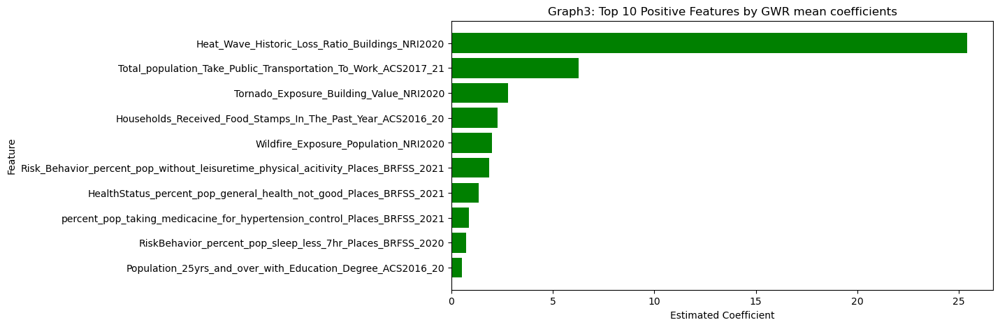

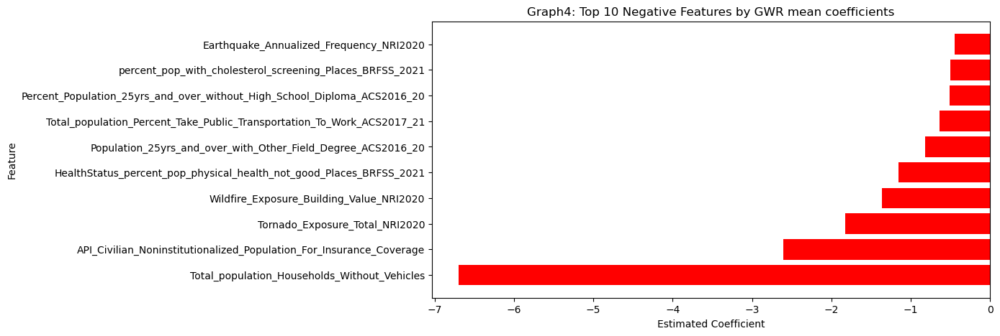

In [38]:
# Ensure GWR results are available and extract mean coefficients
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Extract actual feature names from GWR model
feature_names = ['Intercept'] + list(gwr_df.columns)

# Compute mean coefficients across all counties
mean_coefficients = gwr_results.params.mean(axis=0)

# Create a DataFrame for visualization
coef_df = pd.DataFrame({'Feature': feature_names, 'Estimated_Coefficient': mean_coefficients})

# Sort by estimated coefficient values
coef_df_sorted = coef_df.sort_values(by='Estimated_Coefficient', ascending=False)

# Get top 10 positive and negative features (excluding the intercept)
top_10_positive = coef_df_sorted[coef_df_sorted['Feature'] != 'Intercept'].head(10)
top_10_negative = coef_df_sorted[coef_df_sorted['Feature'] != 'Intercept'].tail(10)

# Plot Top 10 Positive Features
plt.figure(figsize=(10, 5))
plt.barh(top_10_positive['Feature'], top_10_positive['Estimated_Coefficient'], color='green')
plt.xlabel('Estimated Coefficient')
plt.ylabel('Feature')
plt.title('Graph3: Top 10 Positive Features by GWR mean coefficients')
plt.gca().invert_yaxis()
plt.show()

# Plot Top 10 Negative Features
plt.figure(figsize=(10, 5))
plt.barh(top_10_negative['Feature'], top_10_negative['Estimated_Coefficient'], color='red')
plt.xlabel('Estimated Coefficient')
plt.ylabel('Feature')
plt.title('Graph4: Top 10 Negative Features by GWR mean coefficients')
plt.gca().invert_yaxis()
plt.show()


In [39]:
import numpy as np
import pandas as pd
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Define coordinates and target variable
coords = np.column_stack((longitude, latitude))
y_numpy = y.values.reshape(-1, 1)
X = all_race_no_obe[top_50_features]

# Split into training and testing sets
X_train, X_test, y_train, y_test, coords_train, coords_test = train_test_split(
    X, y_numpy, coords, test_size=0.2, random_state=42
)

# Standardize predictors
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Add intercept term
X_train_scaled_with_intercept = np.hstack([np.ones((X_train_scaled.shape[0], 1)), X_train_scaled])
X_test_scaled_with_intercept = np.hstack([np.ones((X_test_scaled.shape[0], 1)), X_test_scaled])

# Select optimal bandwidth using only training data
bandwidth = Sel_BW(coords_train, y_train, X_train_scaled_with_intercept).search()

# Fit GWR model on training data
gwr_model = GWR(coords_train, y_train, X_train_scaled_with_intercept, bandwidth)
gwr_results = gwr_model.fit()

# Compute training predictions
y_train_pred = np.sum(gwr_results.params * X_train_scaled_with_intercept, axis=1).reshape(-1, 1)

# Use trained model to predict test data without exog_scale and exog_resid
test_params = gwr_model.predict(coords_test, X_test_scaled_with_intercept).params

# Compute test predictions
y_test_pred = np.sum(test_params * X_test_scaled_with_intercept, axis=1).reshape(-1, 1)

# Compute MSE
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

print(f"Training MSE: {train_mse:.4f}")
print(f"Testing MSE: {test_mse:.4f}")


Training MSE: 3.1178
Testing MSE: 6.4933


# Nonlinear: Xgboost Shap anlysis

In [ ]:
#make sure all inputs are in correct formats
x_gd = all_race_no_obe[top_100_features]
state = all_race['State']
y_numpy = y.values.reshape(-1, 1) 

x_scaled_gd = scaler.fit_transform(x_gd)
x_scaled_gd = pd.DataFrame(x_scaled_gd, columns=x_gd.columns)
x_scaled_gd['state'] = state
x_scaled_gd['fips'] = fips

y_full_metadata = pd.DataFrame({
    'y': y_numpy.flatten(),  
    'state': x_scaled_gd['state'], 
    'fips': x_scaled_gd['fips']
})

# X_train, X_test, y_train, y_test = train_test_split(x_scaled_gd, y_numpy, test_size=0.2, random_state=222)



In [ ]:
import warnings
warnings.filterwarnings("ignore")
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import mean_squared_error

# Perform a stratified train_test_split 
X_train, X_test, y_train_metadata, y_test_metadata = train_test_split(
    x_scaled_gd, y_full_metadata, test_size=0.2, random_state=222, stratify=y_full_metadata['state']
)
y_train = y_train_metadata['y'].values  
y_test = y_test_metadata['y'].values

X_train_metadata = X_train[['state', 'fips']] 
X_test_metadata = X_test[['state', 'fips']]  




X_train = X_train.drop(columns=['state', 'fips'])
X_test = X_test.drop(columns=['state', 'fips'])

xgb_model = xgb.XGBRegressor(
    verbosity=0,
    objective='reg:squarederror',  
    random_state=42
)

# grid search
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300]
}

# Set up cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=222)

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=cv,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)
print("Best CV Score (negative MSE):", grid_search.best_score_)

#Evaluate the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Test MSE:", mse)

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}
Best CV Score (negative MSE): -3.9972990339327126
Test MSE: 4.231690467774807


In [ ]:
import shap
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)
mean_shap = np.mean(shap_values, axis=0)

# for top 10 positive and negative features 
top10_pos_indices = np.argsort(mean_shap)[-10:]
top10_neg_indices = np.argsort(mean_shap)[:10]

print("\nTop 10 Positive Features (increase prediction):")
for idx in top10_pos_indices[::-1]:
    print(f"{top_100_features[idx]}: Mean SHAP = {mean_shap[idx]:.4f}")

print("\nTop 10 Negative Features (decrease prediction):")
for idx in top10_neg_indices:
    print(f"{top_100_features[idx]}: Mean SHAP = {mean_shap[idx]:.4f}")


Top 10 Positive Features (increase prediction):
Percent_Male_Population_In_Production_Transportation_And_Material_Moving_Occupations_ACS2016_20: Mean SHAP = 0.0618
Total_Population_CVD_Death_Rate_Per_100,000_Residents_CDC_2018_20: Mean SHAP = 0.0292
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021: Mean SHAP = 0.0244
Total_population_Percentage_Households_With_Severe_Housing_Cost_Burden: Mean SHAP = 0.0229
Net Migrants 2010s, total, ages 40-44: Mean SHAP = 0.0226
Per_Capita_Income_In_the_Past_Year_ACS2016_20: Mean SHAP = 0.0170
Percent_Population_25yrs_and_over_without_High_School_Diploma_ACS2016_20: Mean SHAP = 0.0158
API_within_A_Mile_of_Park_Facilities_2020_CDC_ehTracking: Mean SHAP = 0.0156
Households_Received_Food_Stamps_In_The_Past_Year_ACS2016_20: Mean SHAP = 0.0141
Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020: Mean SHAP = 0.0118

Top 10 Negative Features (decrease prediction):
Percentage_Children_Eligible_For_Free_Or_Reduced_Price_Lunch_201

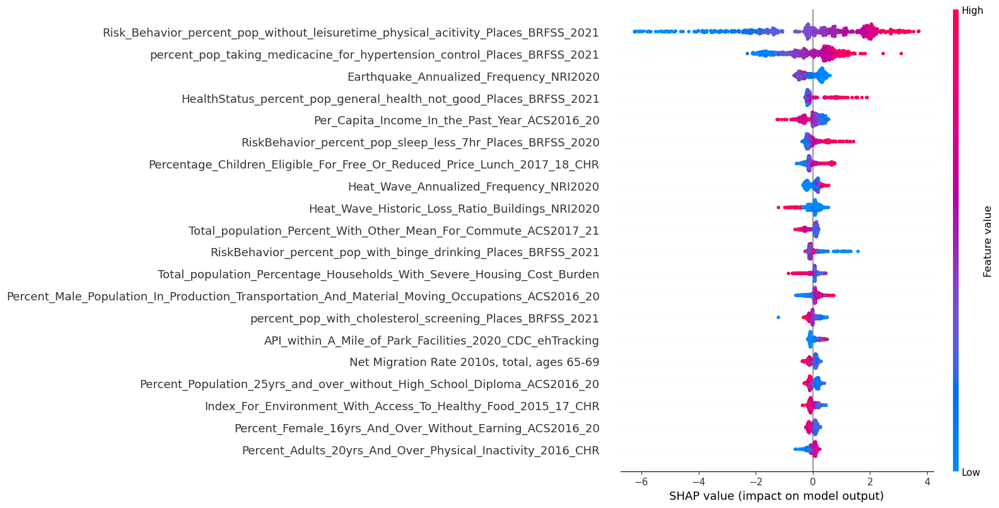

In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(
    shap_values,
    X_test,
    feature_names=top_100_features,
    max_display=20
)


In [ ]:
import numpy as np
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
from IPython.display import display

# these are the black and red states
states_of_interest = ["IA", "SD", "MN", "MT", "WY", "ID", "UT"]


for state in states_of_interest:
    state_indices = X_test_metadata[X_test_metadata['state'] == state].index
    
    if len(state_indices) == 0:
        print(f"No test instances found for state: {state}")
        continue
    index_to_explain = state_indices[0]
    data_row = X_test.loc[index_to_explain].values
    def predict_fn(x):
        return best_model.predict(x)
    
    #Lime
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=X_train.columns,
        mode='regression', 
        discretize_continuous=False
    )


    exp = explainer.explain_instance(
        data_row,
        predict_fn,
        num_features=10
    )
    


    display(exp.show_in_notebook())


None

None

None

None

None

None

None

In [ ]:
print("Unique states in X_test_metadata:", X_test_metadata['state'].unique())


Unique states in X_test_metadata: ['IL' 'KY' 'NV' 'MO' 'IN' 'NJ' 'GA' 'VA' 'KS' 'OH' 'CO' 'VT' 'AR' 'WY'
 'TX' 'MS' 'SD' 'NC' 'MI' 'UT' 'LA' 'NE' 'FL' 'WA' 'NY' 'WV' 'AL' 'IA'
 'TN' 'PA' 'OR' 'OK' 'MN' 'MD' 'ID' 'NM' 'CA' 'ND' 'MA' 'CT' 'AZ' 'AK'
 'SC' 'WI' 'NH' 'MT' 'ME' 'DE' 'HI' 'RI']


In [ ]:
a = all_race_no_obe[top_50_features]
[col for col in a if 'obesity' in col]

[]

# GAM Analysis

In [22]:
import pandas as pd
import numpy as np
from pygam import LinearGAM, s
import matplotlib.pyplot as plt

gam_df = all_race_no_obe[top_50_features]

# Define target and features
features = gam_df.columns  # Assuming 50 selected SDOH features

X = gam_df[features].values
y = all_race_clean['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021'].values

# Train GAM model
gam = LinearGAM(sum([s(i, lam = 0.35) for i in range(50)], start=s(0, lam = 0.35)))
gam.fit(X, y)

LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + s(10) + s(11) + s(12) + s(13) + s(14) + s(15) + s(16) + s(17) + s(18) + s(19) + s(20) + s(21) + s(22) + s(23) + s(24) + s(25) + s(26) + s(27) + s(28) + s(29) + s(30) + s(31) + s(32) + s(33) + s(34) + s(35) + s(36) + s(37) + s(38) + s(39) + s(40) + s(41) + s(42) + s(43) + s(44) + s(45) + s(46) + s(47) + s(48) + s(49) + intercept,
   tol=0.0001, verbose=False)

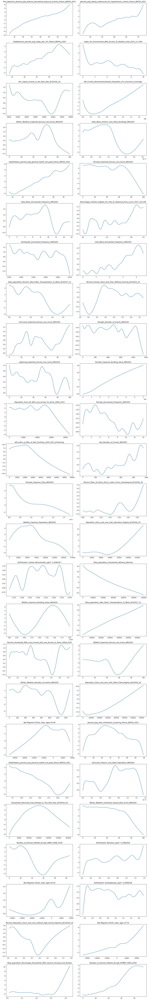

In [23]:
# Plot feature effects
fig, axs = plt.subplots(25, 2, figsize=(15, 100))
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < len(features):
        # Create a new 2D array with all features, except for the ith feature, fixed at their mean
        XX = np.tile(X[:, i].mean(), (100, X.shape[1]))  # Initialize XX with the means of all features
        XX[:, i] = np.linspace(X[:, i].min(), X[:, i].max(), 100)  # Vary only the i-th feature

        # Plot partial dependence
        ax.plot(XX[:, i], gam.partial_dependence(i, XX), label=features[i])
        ax.set_title(features[i])

plt.tight_layout()
plt.show()


In [24]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np
from pygam import LinearGAM, s

# Number of trials for averaging\n",
n_trials = 10
n_splits = 5  # For cross-validation
np.random.seed(42)

# Lambda value for regularization\n",
lam_value = 0.35 

val_mse_scores = []
test_mse_scores = []
cv_mse_scores = []
train_mse_scores = []

for _ in range(n_trials):
    # Split data into training (70%), validation (15%), and testing (15%)
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=None)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=None)
    
    # Train GAM model
    gam = LinearGAM(sum([s(i, lam = lam_value) for i in range(50)], start=s(0, lam = lam_value)))
    gam.fit(X_train, y_train)

    # Training MSE
    y_train_pred = gam.predict(X_train)
    train_mse_scores.append(mean_squared_error(y_train, y_train_pred))
    
    # Validation MSE\n",
    y_val_pred = gam.predict(X_val)
    val_mse_scores.append(mean_squared_error(y_val, y_val_pred))
    
    # Test MSE
    y_test_pred = gam.predict(X_test)
    test_mse_scores.append(mean_squared_error(y_test, y_test_pred))
    
    # Cross-validation
    fold_mse_scores = []
    for _ in range(n_splits):
        X_train_cv, X_test_cv, y_train_cv, y_test_cv = train_test_split(X, y, test_size=0.3, random_state=None)
        gam_cv = LinearGAM(sum([s(i, lam = lam_value) for i in range(50)], start=s(0, lam = lam_value)))
        gam_cv.fit(X_train_cv, y_train_cv)
        y_pred_cv = gam_cv.predict(X_test_cv)
        fold_mse_scores.append(mean_squared_error(y_test_cv, y_pred_cv))
    
    cv_mse_scores.append(np.mean(fold_mse_scores))
    
# Compute and print average MSEs
print(f"Average Training MSE over {n_trials} trials: {np.mean(train_mse_scores):.4f} ± {np.std(train_mse_scores):.4f}")
print(f"Average Validation MSE over {n_trials} trials: {np.mean(val_mse_scores):.4f} ± {np.std(val_mse_scores):.4f}")
print(f"Average Test MSE over {n_trials} trials: {np.mean(test_mse_scores):.4f} ± {np.std(test_mse_scores):.4f}")
print(f"Average Cross-Validation MSE over {n_trials} trials: {np.mean(cv_mse_scores):.4f} ± {np.std(cv_mse_scores):.4f}")

Average Training MSE over 10 trials: 2.8102 ± 0.0675
Average Validation MSE over 10 trials: 6.3100 ± 2.1943
Average Test MSE over 10 trials: 5.5651 ± 2.8893
Average Cross-Validation MSE over 10 trials: 8.8904 ± 2.9285


# More Local Anlysis